# Pakiety

In [87]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
import seaborn as sns

# Wstępne zapoznanie się z danymi


In [68]:
forest_df = pd.read_csv('forest_fires_dataset.csv')
forest_df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


In [69]:
#warto wyświetlić również znaczenie każdej z tych kolumn
attributes_df = pd.read_csv('attributes_forest_fires.csv')

with pd.option_context('display.max_colwidth', 400):
    display(attributes_df)

,name,type,description
0,X,integer,x-axis spatial coordinate within the Montesinho park map: 1 to 9
1,Y,integer,y-axis spatial coordinate within the Montesinho park map: 2 to 9
2,month,string,month of the year: 'jan' to 'dec'
3,day,string,day of the week: 'mon' to 'sun'
4,FFMC,float,FFMC index from the FWI system: 18.7 to 96.20
5,DMC,float,DMC index from the FWI system: 1.1 to 291.3
6,DC,float,DC index from the FWI system: 7.9 to 860.6
7,ISI,float,ISI index from the FWI system: 0.0 to 56.10
8,temp,float,temperature in Celsius degrees: 2.2 to 33.30
9,RH,float,relative humidity in %: 15.0 to 100


dostajemy już kilka informacji na temat zmiennych oraz uwagę, że area może być godne przekształcenia za pomocą logarytmu



Ze strony https://www.nwcg.gov/publications/pms437/cffdrs/fire-weather-index-system możemy uzyskać trochę więcej informacji na temat przynajmniej dla mnie tajemniczych indeksów





**The Fine Fuel Moisture Code (FFMC)** represents fuel moisture of forest litter fuels under the shade of a forest canopy. It is intended to represent moisture conditions for shaded litter fuels, the equivalent of 16-hour timelag. It ranges from 0-101. Subtracting the FFMC value from 100 can provide an estimate for the equivalent (approximately 10h) fuel moisture content, most accurate when FFMC values are roughly above 80.

**The Duff Moisture Code (DMC)** represents fuel moisture of decomposed organic material underneath the litter. System designers suggest that it is represents moisture conditions for the equivalent of 15-day (or 360 hr) timelag fuels. It is unitless and open ended. It may provide insight to live fuel moisture stress.

**The Drought Code (DC)**, much like the Keetch-Byrum Drought Index, represents drying deep into the soil. It approximates moisture conditions for the equivalent of 53-day (1272 hour) timelag fuels. It is unitless, with a maximum value of 1000. Extreme drought conditions have produced DC values near 800.

This example plot of all three moisture codes through a fire season demonstrates how fuel moisture codes rise as fuels dry out, and falls with precipitation and (primarily with FFMC) with moderating weather.

Example plot of fuel moisture trends from 2015 season at the Hogatza RAWS in Alaska. It shows that FWI system fuel moisture codes rise as fuels dry and fall as they are wetted by precipitation.

**The Initial Spread Index (ISI)** is analogous to the NFDRS Spread Component (SC). It integrates fuel moisture for fine dead fuels and surface windspeed to estimate a spread potential. ISI is a key input for fire behavior predictions in the FBP system. It is unitless and open ended.

In [70]:
forest_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


możemy zauważyć, że wartości null nie będą sprawiały problemu

In [71]:
#uzyskajmy kilka jednowymiarowych statysyk w formie tabeli
forest_df.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


można z niej zauważyć np. że kwartyl 3/4 jest nadal zerowy co sugeruje dużą liczbę obserwacji zerowych

In [157]:
forest_df["rain"].value_counts()

#zauważmy zatem, że ta kolumna może nie nieść zbyt wielu informacji, jednak na potrzebe dalszej analizy,
#nie usuwajmy jej jeszcze. zlogarytmowanie nie pomoże zbytnio w tym przypadku

0.0    509
0.8      2
0.2      2
0.4      1
6.4      1
1.4      1
1.0      1
Name: rain, dtype: int64

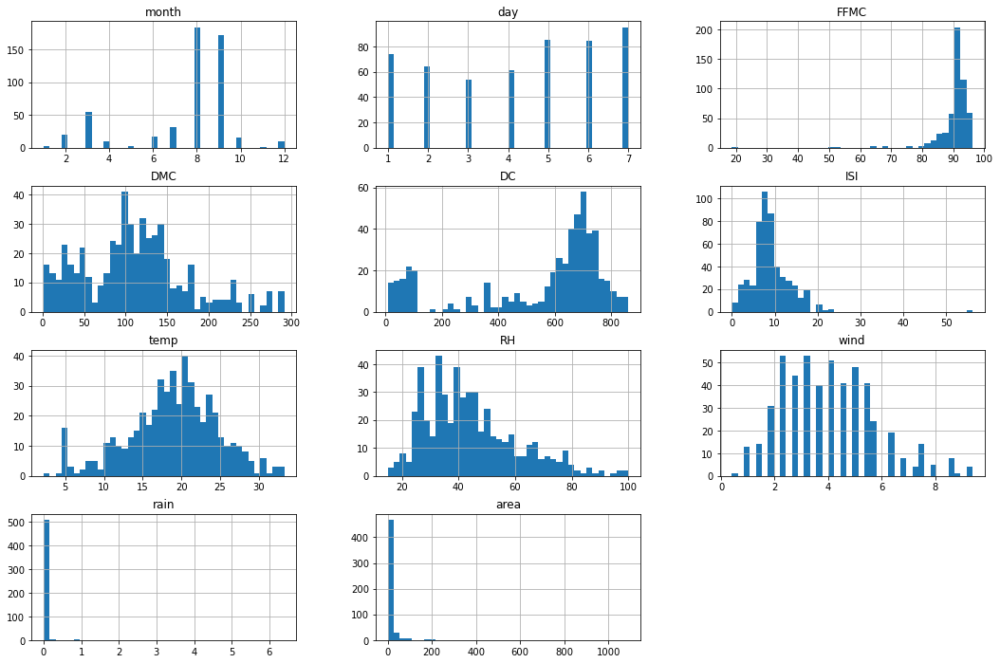

In [121]:
forest_df.drop(['X', 'Y'], axis=1).hist(bins=40,figsize=(18,12))

plt.show()


wiele zmiennych wydaje się mieć dosyć przyjazne rozkłady, niektóre z nich nawet przypominają rozkład normalny użyteczne może być zlogarytmowanie RH oraz area


//coś czego nie bedę uwzględniał pózniej, ale może być ciekawe; aby rozkład FFMC bardziej przypominał normalny można dokonać transformacji na ten moment wydaje się że jakies e^x moze pomóc

//pózniej patrzac na zależność log_area i FFMC w scatterplotcie (wykres kilka komórek niżej) mozna zauważyć sposób ich skolerowania i obserwacja powyżej wydaje się być tym bardziej zasadna

# Zależności między cechami

In [80]:
#aby scatterploty miały większy sens trzeba by nadać factory dniom i miesiącom
#ja jednak po prostu zdecyduje wprowadzić się zmienne numeryczne co może być dodatkowo użyteczne później
dict_days={'mon':1,'tue':2,'wed':3,'thu':4,'fri':5, 'sat':6, "sun":7}
forest_df['day'] = forest_df['day'].map(dict_days)

dict_months={'jan':1,'feb':2,'mar':3,'apr':4,'may':5,'jun':6,'jul':7,'aug':8,'sep':9,'oct':10,'nov':11,'dec':12}

forest_df['month'] = forest_df['month'].map(dict_months)

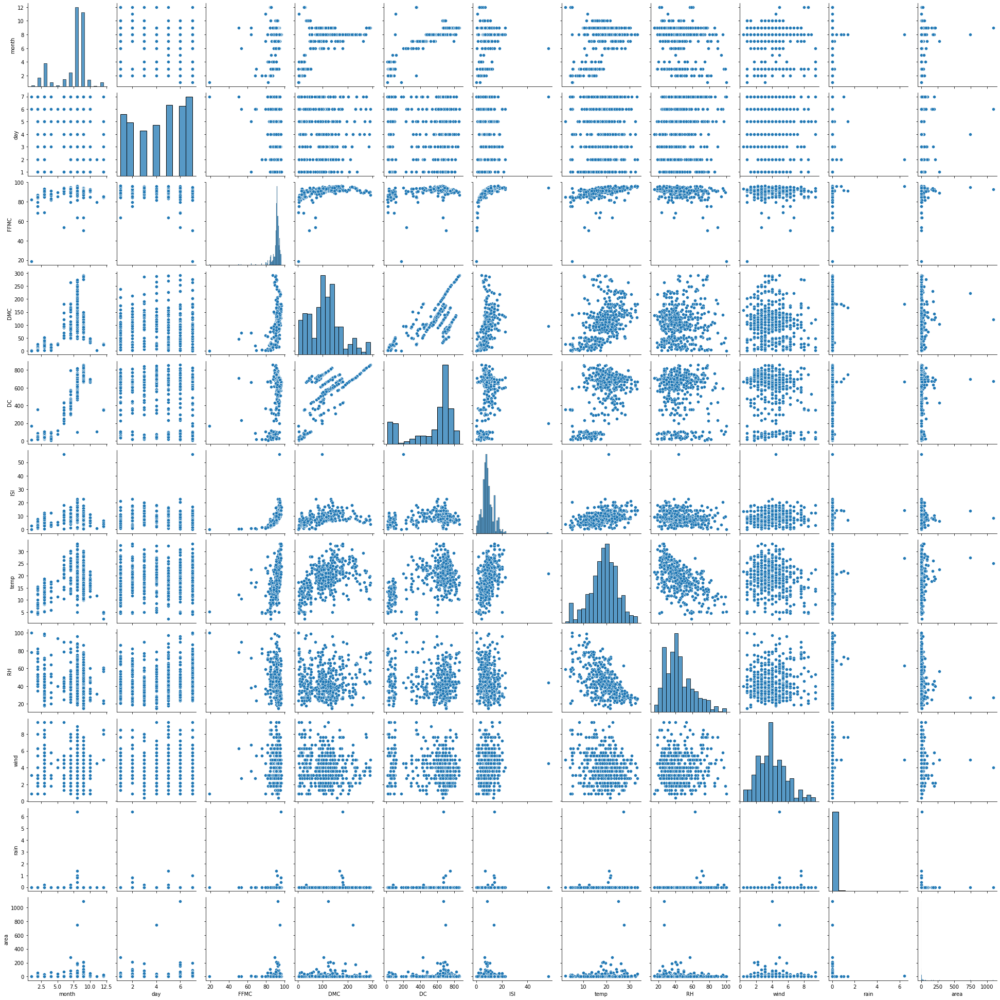

In [83]:
sns.pairplot(forest_df.drop(["X", "Y"], axis=1))
plt.show()

#przejrzyjmy dla intuicji wykresy dwuwymiarowe

linową zależność wydają się wykazywać zmienne DC i DMC

FFMC wydaje się mieć logarytmiczną zależność z DMC DC oraz ISI.
Ponieważ każdy z tych indeksów reprezentuje w pewien sposób wilgoć, wydaje się to być zasadne

In [118]:
#dokonajmy takiej analizy ponownie jednak stworzmy nowy dataset

forest_df_transformed = forest_df.copy()
forest_df_transformed["log_RH"] = np.log1p(forest_df_transformed["RH"])
forest_df_transformed["log_area"] = np.log1p(forest_df_transformed["area"])

#wyrzucmy tez kolumne RH i area
forest_df_transformed = forest_df_transformed.drop(['RH','area'], axis=1)

#zmiany zostały uzasadnione wyżej

#mimo, że maksymlany pomiar ISI może jest poprawną obserwacją, zdecyduje się za zamienienie go drugą co do wielkości wartością (uzasadnione wyżej)
second_max_ISI = max(forest_df[forest_df["ISI"] != max(forest_df["ISI"])]["ISI"]) #uzyskanie drugiej co do wielkości wartości
forest_df_transformed["ISI"] = forest_df_transformed["ISI"].replace(max(forest_df["ISI"]),second_max_ISI)

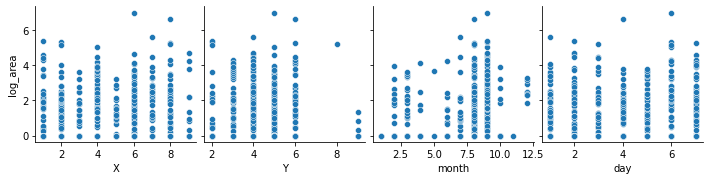

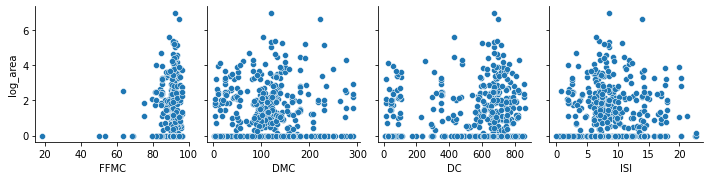

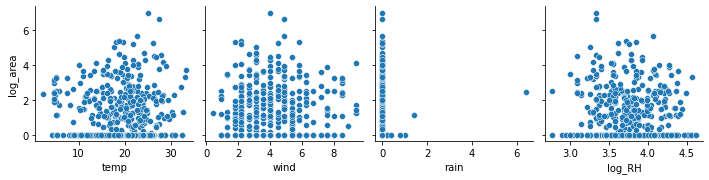

In [120]:
sns.pairplot(forest_df_transformed, y_vars="log_area", x_vars=forest_df_transformed.columns.values[:4], diag_kind = None)#diag_kind ze stacka bo inaczej nie bylo wartosci wyswieltnaych
sns.pairplot(forest_df_transformed, y_vars="log_area", x_vars=forest_df_transformed.columns.values[4:8], diag_kind = None)
sns.pairplot(forest_df_transformed, y_vars="log_area", x_vars=forest_df_transformed.columns.values[8:12], diag_kind = None)

plt.show()

#ponieważ jest to Portugalia, okres lata "odpowiada" naszej półkuli, zatem zgodnie z intuicją widzimy
#że to wtedy pożary były większe (widać szczególnie przed zlogarytmowaniem), ale ładniejsza analiza tego aspektu znajdzie się niżej

żadna ze zmiennych nie wydaje się być silnie skolerowana z nasza zmienną celu


dla zmiennych kategorycznych czyli naszych miesięcy i dni wydaje się bardzo nieporęcznie wnioskować z powyższych wykresów

rozsądne będzie jakieś podsumowanie w formie barplotów uwzględniając liczbę wystąpień pożarów czy średni spalony obszar

szczególnie zasadne wydaje się to dla miesięcy 

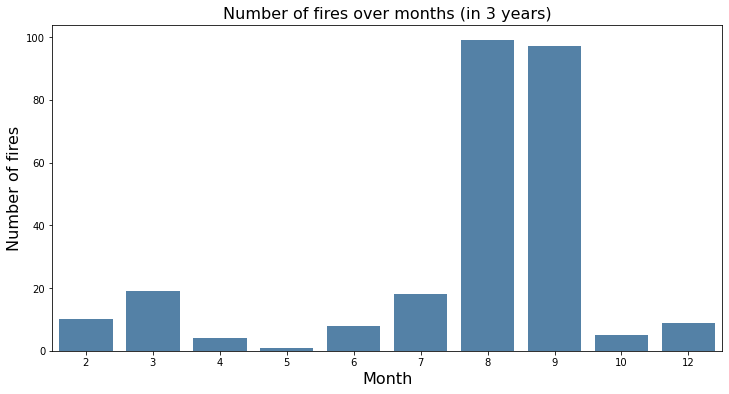

In [125]:
plt.figure(figsize=(12,6))
sns.countplot(data=forest_df[forest_df["area"] != 0], x="month", color = "steelblue")
plt.title("Number of fires over months counting different areas separetly", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.ylabel("Number of fires", fontsize=16)
plt.show()

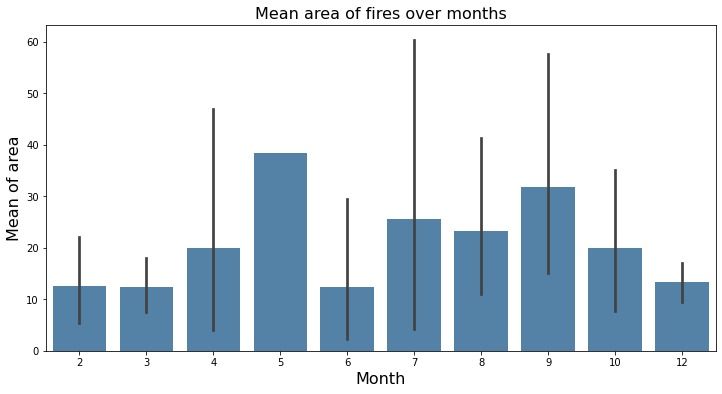

In [142]:
plt.figure(figsize=(12,6))
sns.barplot(data=forest_df[forest_df["area"] != 0], x="month", y = "area", color = "steelblue", estimator = np.mean)
plt.title("Mean area of fires over months", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.ylabel("Mean of area", fontsize=16)
plt.show()

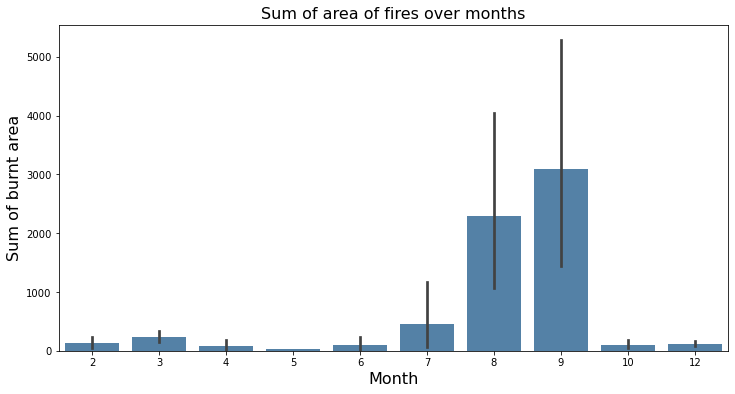

In [141]:
plt.figure(figsize=(12,6))
sns.barplot(data=forest_df[forest_df["area"] != 0], x="month", y = "area", color = "steelblue", estimator = np.sum)
plt.title("Sum of area of fires over months", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.ylabel("Sum of burnt area", fontsize=16)
plt.show()

może dziwić wysoka średnia spalonego obszaru w maju, lecz pożar był tylko jeden

częstotliwość występowania pożarów zwiększa się w lecie. Także powierzchnia spalonego obszaru jako suma czy średnia wzrasta

zauważmy, że w styczniu nie było żadnego pożaru

teraz może nasuwać się pytanie, czy pożary są tak samo dotkliwe dla każdego z obszarów parku?

można zauważyć, że podane koordynaty w naszej ramce danych bedą sprzyjały utworzeniu Heatmapy w celu przeanalizowania tego zjawiska

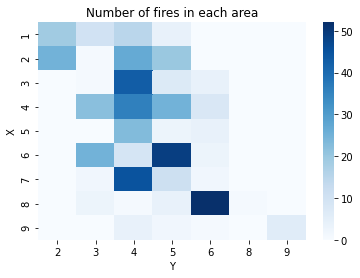

In [145]:
heat_map = forest_df.loc[:,['X','Y','area']].groupby(['X', 'Y'], as_index = False).agg("count")
heat_map = heat_map.pivot(index = 'X', columns = 'Y', values = 'area')
heat_map[heat_map.isna()] = 0
sns.heatmap(heat_map, cmap = "Blues").set_title("Number of fires in each region")
plt.show()


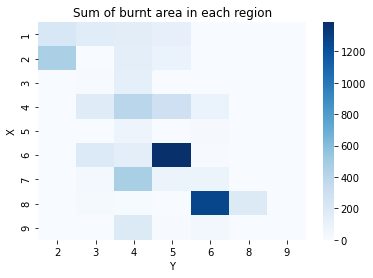

In [146]:
heat_map = forest_df.loc[:,['X','Y','area']].groupby(['X', 'Y'], as_index = False).agg("sum")
heat_map = heat_map.pivot(index = 'X', columns = 'Y', values = 'area')
heat_map[heat_map.isna()] = 0
sns.heatmap(heat_map, cmap = "Blues").set_title("Sum of burnt area in each region")
plt.show()

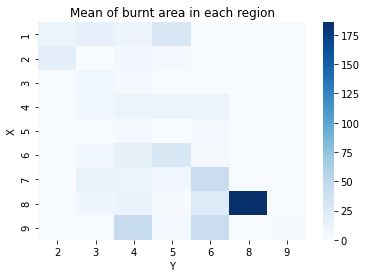

In [147]:
heat_map = forest_df.loc[:,['X','Y','area']].groupby(['X', 'Y'], as_index = False).agg("mean")
heat_map = heat_map.pivot(index = 'X', columns = 'Y', values = 'area')
heat_map[heat_map.isna()] = 0
sns.heatmap(heat_map, cmap = "Blues").set_title("Mean of burnt area in each region")
plt.show()

dzięki temu uzyskujemy informacje na temat poszczególnych obszarów

opcjonalnie można usunąc lub zastapić w pewien sposób wartość średniej dla obszaru (8,8), gdyż miał tam miejsce jeden pożar. Wpływa to w pewien sposób na "zaburzenie" w naszej skali barw


nie wiem, czy to obręb tej pracy domowej, ale na koniec warto by dokonać przeskalowania zmiennych, czy standaryzacji

# Autamatyczne narzędzie do eksploracji danych
wykorzystajmy pierwszą z opcji czyli pandas profiling

In [149]:
import pandas_profiling as pp

In [151]:
profile = pp.ProfileReport(pd.read_csv('forest_fires_dataset.csv'), title='Pandas Profiling Report For Forest Fires Data', explorative=True)

In [152]:
profile.to_notebook_iframe()

In [158]:
profile.to_file(output_file='pandas_profiling_report.html') #zapis do pliku

Narzędzie pozwoliło w szybki sposób uzyskać generalny overview danych.
Szczególnie ciekawa wydało mi się ostrzeżenie na temat zerowych wartości w kolumnie rain czy duplikatach.
Pojawiła się również informacja o niewystępowaniu braku danych.
Fajne podsumowanie zmiennych i zależności między nimi.
Mapa współczynników korelacji ciekawa, ja jej nie zrobiłem, (w sumie mogłem dodać, ale przeanalizowałem już tą i widać naprzykład ujemne skolerowanie temperatury i wilogci).

Ograniczeniem jest pewien limit głębokości spojrzenia w dane. Narzędzie nie pozwoli nam, stworzenie odrobinę bardziej skomplikowanych wizualizacji, czy "spersonalizowanych" dla konretnej sytuacji (przykładowo przestrzenne pokazanie wyników jako "mapy" parku, a także użycie logarytmu dla area czy RH) (niektóre zależności nie zostały pokazane np. nie da się stworzyć tych odnośnie miesięcy (scatterplotow)).